# ShapeMask Instance Segmentation Demo
This Colab demonstrates how to use a ShapeMask model that was trained on Cloud TPU to perform instance segmentation on a sample input image. The resulting predictions are overlayed on the sample image as boxes, instance masks, and labels. You can also experiment with your own images by editing the input image URL.

### About ShapeMask
An instance segmentation can identify and highlight multiple instances of various objects in an image. For example, in a family photo containing several people, this type of model would automatically highlight each person with a different color. Examples of such instance segmentation models include Mask R-CNN and ShapeMask.

Generally, an instance segmentation model creates detection boxes for various objects in the first step and uses those boxes to identify exact object boundaries and to highlight those objects in the second step. ShapeMask uses a unique technique in the second step - it does not critically depend on the initial detection boxes to identify the exact object boundaries. Instead, the algorithm learns the shapes of various objects by looking at similarities between neighboring pixels. This technique helps ShapeMask produce more accurate results at the end, even for some of the object categories that were not seen during training.  

# Instructions
<h3><a href="https://cloud.google.com/tpu/"><img valign="middle" src="https://raw.githubusercontent.com/GoogleCloudPlatform/tensorflow-without-a-phd/master/tensorflow-rl-pong/images/tpu-hexagon.png" width="50"></a>  &nbsp;&nbsp;Use a free Cloud TPU</h3>
 
   1. On the main menu, click Runtime and select **Change runtime type**. Set "TPU" as the hardware accelerator.
   2. Click Runtime again and select **Runtime > Run All**. You can also run the cells manually with Shift-ENTER.

## Download the source code
Download the source code of the ShapeMask model.

In [1]:
!git clone -b shapemask https://github.com/tensorflow/tpu/

Cloning into 'tpu'...
remote: Enumerating objects: 10497, done.
remote: Counting objects: 100% (699/699), done.
remote: Compressing objects: 100% (442/442), done.
remote: Total 10497 (delta 339), reused 487 (delta 243), pack-reused 9798
Receiving objects: 100% (10497/10497), 45.52 MiB | 27.31 MiB/s, done.
Resolving deltas: 100% (7377/7377), done.


## Import libraries

In [2]:
from IPython import display
from PIL import Image
import numpy as np
import tensorflow.compat.v1 as tf
import sys
sys.path.insert(0, 'tpu/models/official')
sys.path.insert(0, 'tpu/models/official/detection')
sys.path.insert(0, 'tpu/models/official/detection/utils') #Menambahkan modul yg sudah kita clone dari github ke folder sistem python
from utils.object_detection import visualization_utils
from evaluation import coco_utils

## Load the COCO dataset index mapping
This Colab uses a pretrained checkpoint of the ShapeMask model that is trained using the COCO dataset. Here is the mapping between the indices that the model predicts and the categories in text.

In [3]:
ID_MAPPING = {
    1: 'person',
    2: 'bicycle',
    3: 'car',
    4: 'motorcycle',
    5: 'airplane',
    6: 'bus',
    7: 'train',
    8: 'truck',
    9: 'boat',
    10: 'traffic light',
    11: 'fire hydrant',
    13: 'stop sign',
    14: 'parking meter',
    15: 'bench',
    16: 'bird',
    17: 'cat',
    18: 'dog',
    19: 'horse',
    20: 'sheep',
    21: 'cow',
    22: 'elephant',
    23: 'bear',
    24: 'zebra',
    25: 'giraffe',
    27: 'backpack',
    28: 'umbrella',
    31: 'handbag',
    32: 'tie',
    33: 'suitcase',
    34: 'frisbee',
    35: 'skis',
    36: 'snowboard',
    37: 'sports ball',
    38: 'kite',
    39: 'baseball bat',
    40: 'baseball glove',
    41: 'skateboard',
    42: 'surfboard',
    43: 'tennis racket',
    44: 'bottle',
    46: 'wine glass',
    47: 'cup',
    48: 'fork',
    49: 'knife',
    50: 'spoon',
    51: 'bowl',
    52: 'banana',
    53: 'apple',
    54: 'sandwich',
    55: 'orange',
    56: 'broccoli',
    57: 'carrot',
    58: 'hot dog',
    59: 'pizza',
    60: 'donut',
    61: 'cake',
    62: 'chair',
    63: 'couch',
    64: 'potted plant',
    65: 'bed',
    67: 'dining table',
    70: 'toilet',
    72: 'tv',
    73: 'laptop',
    74: 'mouse',
    75: 'remote',
    76: 'keyboard',
    77: 'cell phone',
    78: 'microwave',
    79: 'oven',
    80: 'toaster',
    81: 'sink',
    82: 'refrigerator',
    84: 'book',
    85: 'clock',
    86: 'vase',
    87: 'scissors',
    88: 'teddy bear',
    89: 'hair drier',
    90: 'toothbrush',
}
category_index = {k: {'id': k, 'name': ID_MAPPING[k]} for k in ID_MAPPING} #Memindahkan ID_MAPPING ke dalam sebuah dictionary

In [4]:
category_index #Dictionary label dari segmentation yang akan kita buat

{1: {'id': 1, 'name': 'person'},
 2: {'id': 2, 'name': 'bicycle'},
 3: {'id': 3, 'name': 'car'},
 4: {'id': 4, 'name': 'motorcycle'},
 5: {'id': 5, 'name': 'airplane'},
 6: {'id': 6, 'name': 'bus'},
 7: {'id': 7, 'name': 'train'},
 8: {'id': 8, 'name': 'truck'},
 9: {'id': 9, 'name': 'boat'},
 10: {'id': 10, 'name': 'traffic light'},
 11: {'id': 11, 'name': 'fire hydrant'},
 13: {'id': 13, 'name': 'stop sign'},
 14: {'id': 14, 'name': 'parking meter'},
 15: {'id': 15, 'name': 'bench'},
 16: {'id': 16, 'name': 'bird'},
 17: {'id': 17, 'name': 'cat'},
 18: {'id': 18, 'name': 'dog'},
 19: {'id': 19, 'name': 'horse'},
 20: {'id': 20, 'name': 'sheep'},
 21: {'id': 21, 'name': 'cow'},
 22: {'id': 22, 'name': 'elephant'},
 23: {'id': 23, 'name': 'bear'},
 24: {'id': 24, 'name': 'zebra'},
 25: {'id': 25, 'name': 'giraffe'},
 27: {'id': 27, 'name': 'backpack'},
 28: {'id': 28, 'name': 'umbrella'},
 31: {'id': 31, 'name': 'handbag'},
 32: {'id': 32, 'name': 'tie'},
 33: {'id': 33, 'name': 'suitc

## Load an image
Now, you can load an image. Use either the sample image included here, or update the field with an image of your choice.

--2021-11-23 06:35:13--  https://wallpapercave.com/wp/wp2967435.jpg
Resolving wallpapercave.com (wallpapercave.com)... 172.67.20.199, 104.22.60.71, 104.22.61.71, ...
Connecting to wallpapercave.com (wallpapercave.com)|172.67.20.199|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 761835 (744K) [image/jpeg]
Saving to: ‘test.jpg’

test.jpg            100%[===================>] 743.98K  --.-KB/s    in 0.06s   

2021-11-23 06:35:13 (11.4 MB/s) - ‘test.jpg’ saved [761835/761835]



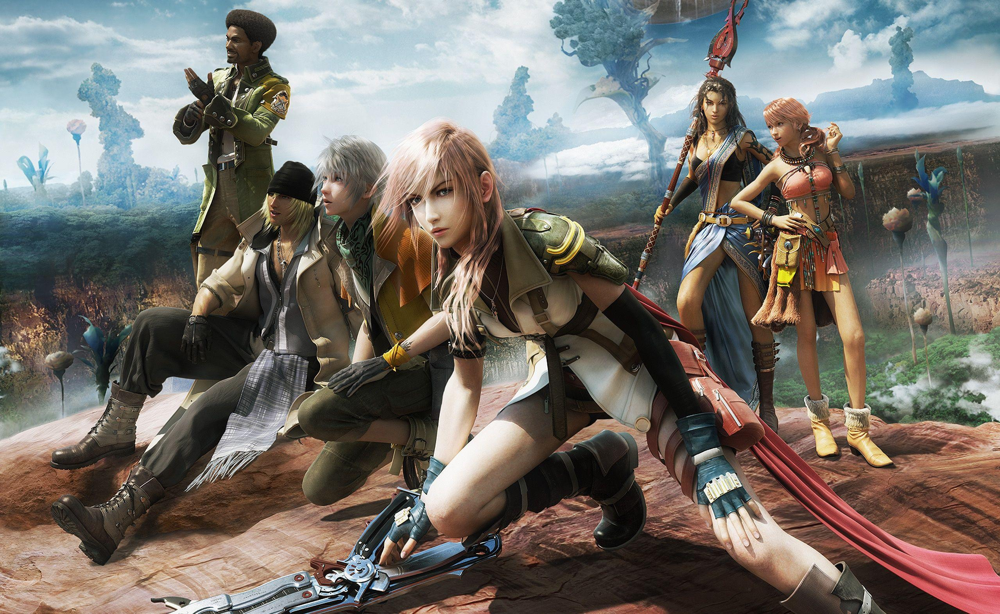

In [5]:
#Mengambil gambar dari internet dan menyimpannya dengan nama 'test.jpg'
!wget https://wallpapercave.com/wp/wp2967435.jpg -O test.jpg
image_path = 'test.jpg'

#menampilkan gambar
with open(image_path, 'rb') as f:
  np_image_string = np.array([f.read()])
  
image = Image.open(image_path)
width, height = image.size
#Menyimpan gambar dalam bentuk array kedalam variabel np_image
np_image = np.array(image.getdata()).reshape(height, width, 3).astype(np.uint8)

display.display(display.Image(image_path, width=1024))

## Create a Tensorflow session
Create a Tensorflow session to run the inference. You can either connect to a TPU or a normal CPU backend.

In [6]:
#Penjelasan ttg TPU vs GPU vs CPU : https://analyticsindiamag.com/tpu-vs-gpu-vs-cpu-which-hardware-should-you-choose-for-deep-learning/

#Jika mau menghilangkan tools param, hapus tanda "@" pada komentar param dibawah
use_tpu = True #@param {type:"boolean"}
if use_tpu: #Mengecek apakah kita akaan menggunakan TPU atau tidak
  import os
  import pprint

  #Jika kita menggunakan TPU, maka sistem akan mengecek apakah disistem kita sudah terkoneksi dengan runtime TPU
  #Jika belum maka akan menampilkan error seperti ini:
  assert 'COLAB_TPU_ADDR' in os.environ, 'ERROR: Not connected to a TPU runtime; please see the first cell in this notebook for instructions!'

  #Jika sudah, maka sistem akan mencari Address dari TPU tersebut dan menampilkannya
  TPU_ADDRESS = 'grpc://' + os.environ['COLAB_TPU_ADDR']
  print('TPU address is', TPU_ADDRESS)

  #Memindahkan session ke TPU (jadi nanti seluruh proses yg menggunakan tensorflow akan dijalankan oleh TPU)
  session = tf.Session(TPU_ADDRESS, graph=tf.Graph())
  #Menampilkan List TPU Devices yang kita punya
  print('TPU devices:')
  pprint.pprint(session.list_devices())
else:
  #Jika kita tidak memakai TPU makan seluruh proses yg menggunakan tensorflow akan dijalankan sesuai dgn runtime yg kita atur
  session = tf.Session(graph=tf.Graph())

TPU address is grpc://10.11.8.114:8470
TPU devices:
[_DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:CPU:0, CPU, -1, -7854718855266045439),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 8589934592, 1368204860291101150),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:0, TPU, 17179869184, 5599543141995820594),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:1, TPU, 17179869184, -6694077092697295120),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:2, TPU, 17179869184, -3602830905202827845),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:3, TPU, 17179869184, 1251056401407469472),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:4, TPU, 17179869184, 8792436685893554727),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:5, TPU, 17179869184, 3637190562999375312),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:6, TPU, 17179869184, 227201464

# Load the pretrained model
Loading the COCO pretrained saved model from the public GCS bucket.

In [7]:
#Mengambil coco pretained model yg sudah disediakan oleh shapemask
saved_model_dir = 'gs://cloud-tpu-checkpoints/shapemask/1571767330' #@param {type:"string"}
_ = tf.saved_model.loader.load(session, ['serve'], saved_model_dir)

Instructions for updating:
This function will only be available through the v1 compatibility library as tf.compat.v1.saved_model.loader.load or tf.compat.v1.saved_model.load. There will be a new function for importing SavedModels in Tensorflow 2.0.
INFO:tensorflow:Restoring parameters from gs://cloud-tpu-checkpoints/shapemask/1571767330/variables/variables


## Perform instance segmentation and retrieve the predictions
Now let's run the inference and process the predictions from the model.


In [8]:
num_detections, detection_boxes, detection_classes, detection_scores, detection_masks, detection_outer_boxes, image_info = session.run(
    ['NumDetections:0', 'DetectionBoxes:0', 'DetectionClasses:0', 'DetectionScores:0', 'DetectionMasks:0', 'DetectionOuterBoxes:0', 'ImageInfo:0'],
    feed_dict={'Placeholder:0': np_image_string})

num_detections = np.squeeze(num_detections.astype(np.int32), axis=(0,)) #Variabel untuk menyimpan ada berapa jumlah objek yg terdeteksi
detection_boxes = np.squeeze(detection_boxes / min(image_info[0, 2]), axis=(0,))[0:num_detections] 
detection_outer_boxes = np.squeeze(detection_outer_boxes / min(image_info[0, 2]), axis=(0,))[0:num_detections]
detection_scores = np.squeeze(detection_scores, axis=(0,))[0:num_detections] #Variabel untuk menyimpan dan score probability sebuah objek masuk ke sebuah kelas
detection_classes = np.squeeze(detection_classes.astype(np.int32), axis=(0,))[0:num_detections] #Variabel untuk menyimpan kelas dari sebuah objek
instance_masks = np.squeeze(detection_masks, axis=(0,))[0:num_detections] #Varuabel untuk menyimpan hasil instance segmentation
# Use outer boxes 
ymin, xmin, ymax, xmax = np.split(detection_outer_boxes, 4, axis=-1)
processed_boxes = np.concatenate([xmin, ymin, xmax - xmin, ymax - ymin], axis=-1)

#Melakukan proses segemntasi terhadap gambar menggunakan pretained model coco yang telah kita load
segmentations = coco_utils.generate_segmentation_from_masks(instance_masks, processed_boxes, height, width)

In [9]:
 detection_classes

array([ 1,  1,  1,  1,  1,  1,  1, 16, 38,  1, 38, 16, 33,  1, 31, 32, 31,
       43,  1, 19,  1, 32, 28, 64, 32, 38, 31,  1, 38, 28, 16, 32, 16, 32,
       31,  4, 32, 77, 16, 31, 33, 31,  1, 48, 32, 31, 62, 28, 33, 32, 33,
        4,  2,  1, 31, 31, 19,  2, 31, 16, 77, 32,  9,  2, 32, 16, 27, 32,
       19,  1, 38,  1, 16,  1,  1,  1, 16, 38, 42, 15, 16, 31, 16, 52, 32,
       16, 31, 32,  4, 32, 84,  1,  4, 31, 31,  1, 44, 38, 31, 33],
      dtype=int32)

## Visualize the detection results
Time to check out the result!

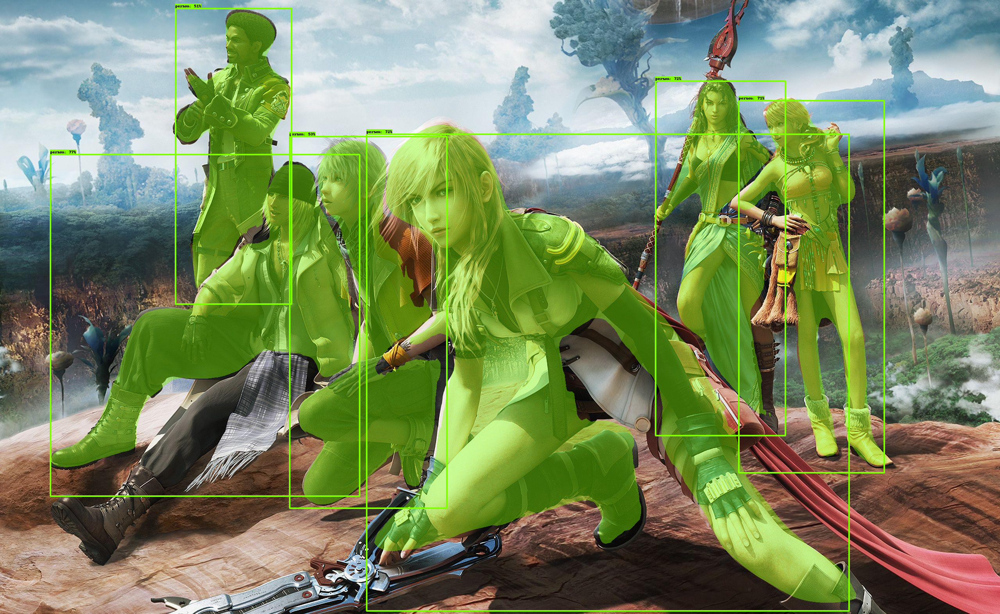

In [10]:
#Jika mau menghilangkan tools slider, hapus tanda "@" pada komentar param dibawah
max_boxes_to_draw = 44   #@param {type:"integer"}
min_score_thresh = 0.5    #@param {type:"slider", min:0, max:1, step:0.01}

image_with_detections = visualization_utils.visualize_boxes_and_labels_on_image_array(
    np_image * 1,
    detection_boxes,
    detection_classes,
    detection_scores,
    category_index,
    instance_masks=segmentations,
    use_normalized_coordinates=False,
    max_boxes_to_draw=max_boxes_to_draw,
    min_score_thresh=min_score_thresh)

output_image_path = 'test_results.png'
Image.fromarray(image_with_detections.astype(np.uint8)).save(output_image_path)
display.display(display.Image(output_image_path, width=1024))

# Edge Detection menggunakan Sobel Detection

In [11]:
#Mengambil gambar dari internet dan menyimpannya dengan nama 'test_edge.jpg'
!wget https://images6.alphacoders.com/785/thumb-1920-785047.png -O test_edge.jpg


--2021-11-23 06:35:34--  https://images6.alphacoders.com/785/thumb-1920-785047.png
Resolving images6.alphacoders.com (images6.alphacoders.com)... 172.67.3.36, 104.20.14.194, 104.20.15.194, ...
Connecting to images6.alphacoders.com (images6.alphacoders.com)|172.67.3.36|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2167643 (2.1M) [image/png]
Saving to: ‘test_edge.jpg’

test_edge.jpg       100%[===================>]   2.07M  --.-KB/s    in 0.07s   

2021-11-23 06:35:34 (28.8 MB/s) - ‘test_edge.jpg’ saved [2167643/2167643]



Original Image


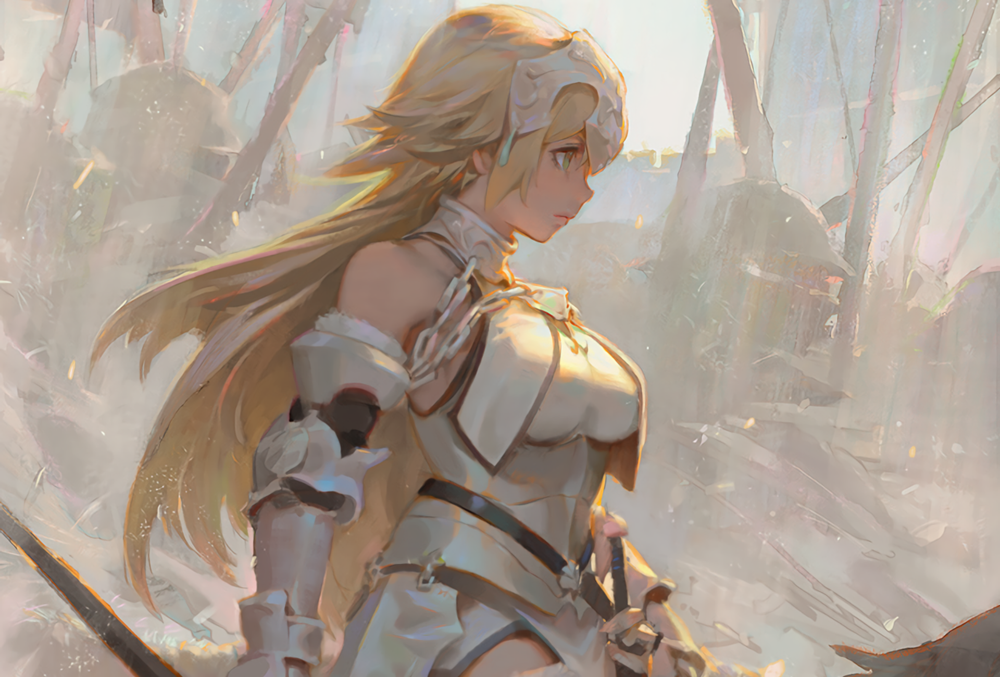

Sobel Edge Detection on the X axis


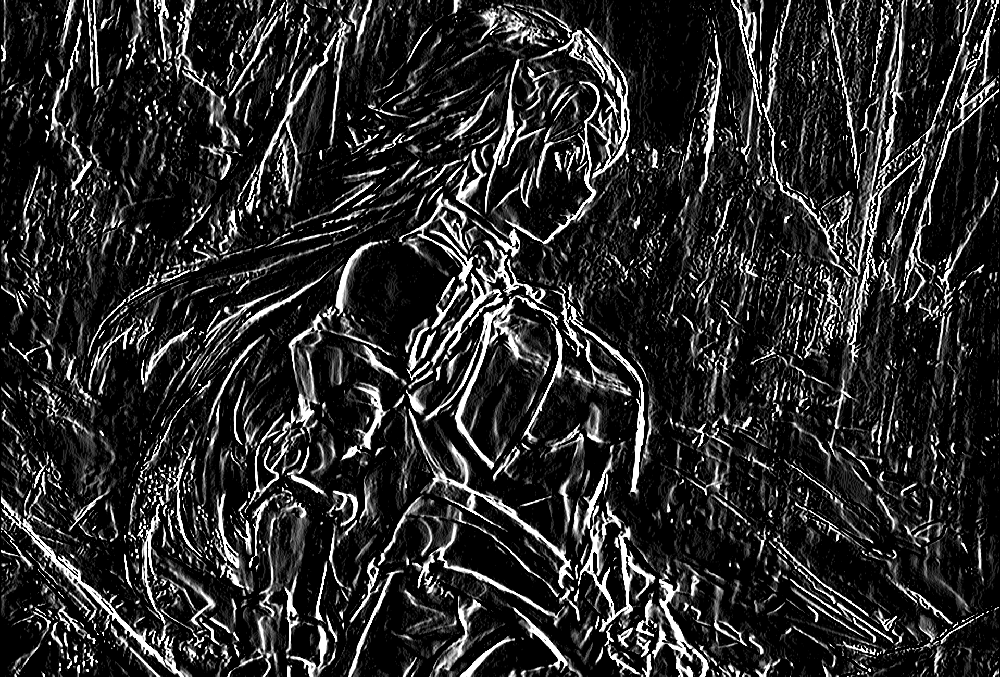

Sobel Edge Detection on the Y axis


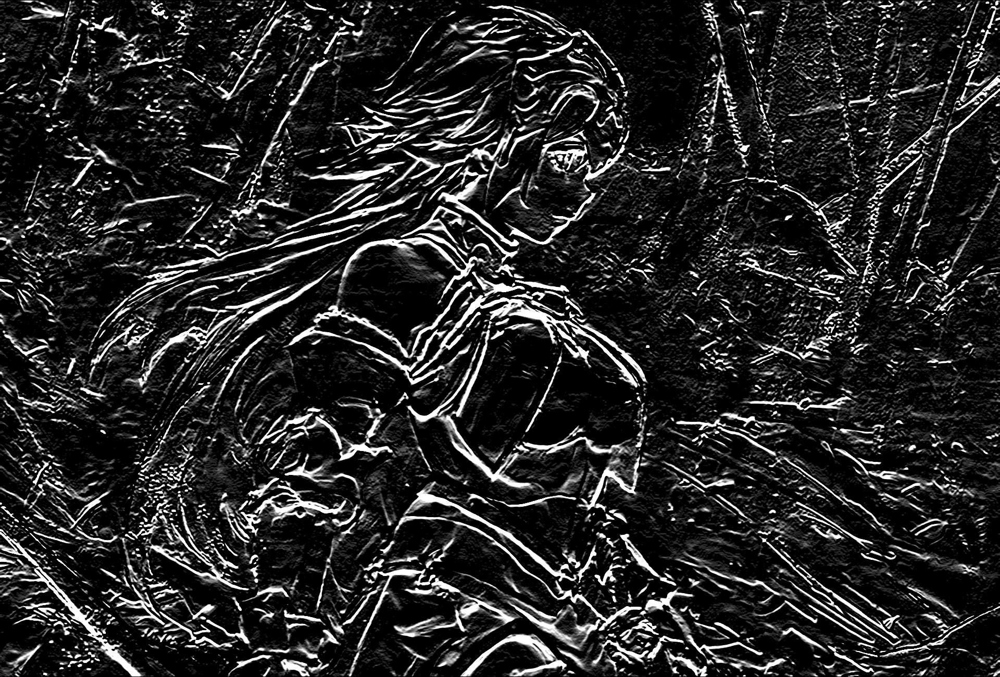

Combined X and Y Sobel Edge Detection


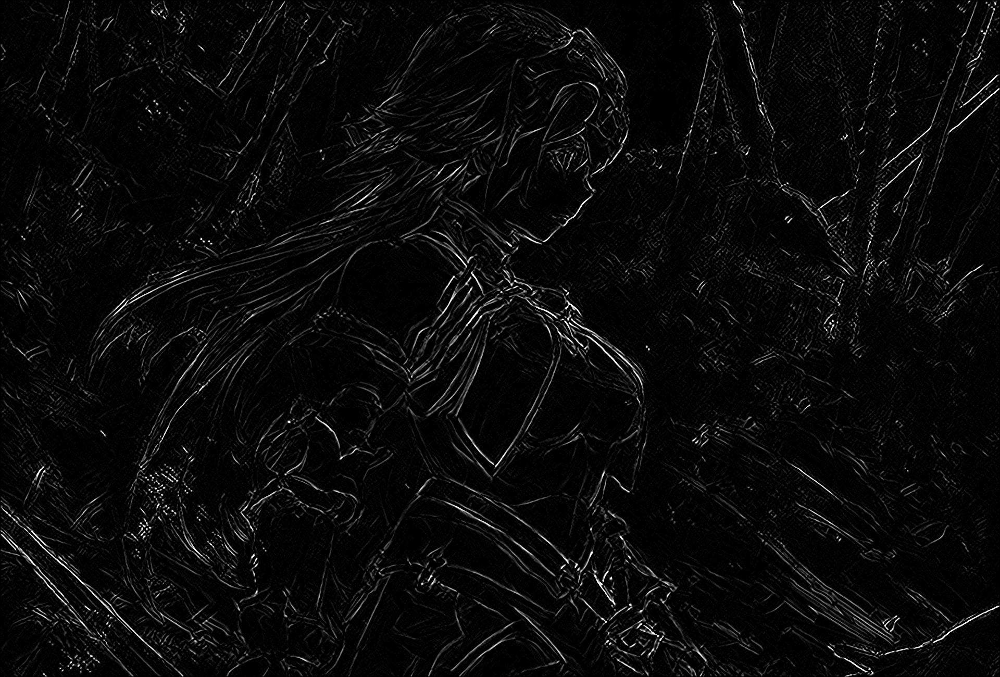

In [12]:
import cv2
from google.colab.patches import cv2_imshow
# Read the original image
print('Original Image')
img = cv2.imread('test_edge.jpg')

# Display original image
cv2_imshow(img) #if you're using jupyter notebook replace cv2_imshow with cv2.imshow
cv2.waitKey(0)

# Convert to graycsale
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Blur the image for better edge detection
img_blur = cv2.GaussianBlur(img_gray, (3,3), 0)

# Sobel Edge Detection
sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection

# Display Sobel Edge Detection Images
print('Sobel Edge Detection on the X axis')
cv2_imshow(sobelx) #if you're using jupyter notebook replace cv2_imshow with cv2.imshow
cv2.waitKey(0)
print('Sobel Edge Detection on the Y axis')
cv2_imshow(sobely) #if you're using jupyter notebook replace cv2_imshow with cv2.imshow
cv2.waitKey(0)
print('Combined X and Y Sobel Edge Detection')
cv2_imshow(sobelxy) #if you're using jupyter notebook replace cv2_imshow with cv2.imshow